# Visualizing the outputs of the full reco chain (w/o ghost points)
This notebook is dedicated to listing the outputs of the full reco chain that can be useful for downstream analysis. It will not explain more technical outputs (e.g. PPN1/2 masks, seediness and margins for CNN clusterings).

WARNING: The current weight is "dummy", don't expect great results.

We start with standard imports:

In [1]:
import numpy as np
import yaml
import torch
import plotly
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected=False)

Replace this with the path to your own code folder:

In [2]:
import sys
# set software directory
software_dir = '/u/ki/ldomine/lartpc_mlreco3d'
sys.path.insert(0,software_dir)

Now we can import helpers from the `lartpc_mlreco3d` library.

In [3]:
from mlreco.visualization import scatter_points, plotly_layout3d
from mlreco.visualization.gnn import scatter_clusters, network_topology, network_schematic
from mlreco.utils.ppn import uresnet_ppn_type_point_selector
from mlreco.utils.cluster_cnn import fit_predict, gaussian_kernel
from mlreco.main_funcs import process_config, prepare
from mlreco.utils.gnn.cluster import get_cluster_label
from mlreco.utils.deghosting import adapt_labels_numpy as adapt_labels
from mlreco.visualization.gnn import network_topology


from larcv import larcv

Welcome to JupyROOT 6.16/00


## Running the configuration

In [75]:
cfg = """
iotool:
  batch_size: 32
  shuffle: False
  num_workers: 4
  collate_fn: CollateSparse
  sampler:
    batch_size: 32
    name: RandomSequenceSampler
  dataset:
    name: LArCVDataset
    data_keys:
      - /gpfs/slac/staas/fs1/g/neutrino/kterao/data/mpvmpr_2020_01_v04/train.root
    limit_num_files: 10
    schema:
      input_data:
        - parse_sparse3d_scn
        - sparse3d_pcluster
      segment_label:
        - parse_sparse3d_scn
        - sparse3d_pcluster_semantics
      cluster_label:
        - parse_cluster3d_clean_full
        - cluster3d_pcluster
        - particle_pcluster
        - sparse3d_pcluster_semantics
      particles_label:
        - parse_particle_points
        - sparse3d_pcluster
        - particle_corrected
model:
  name: ghost_chain
  modules:
    chain:
      enable_uresnet: True
      enable_ppn: True
      enable_cnn_clust: True
      enable_gnn_shower: True
      enable_gnn_tracks: False
      enable_gnn_int: True
      enable_ghost: False
      use_ppn_in_gnn: False
    # Particle GNN config
    particle_gnn:
      node_type: 0
      node_min_size: 10
    dbscan_frag:
      dim: 3
      eps: [1.999, 3.999, 1.999, 4.999]
      min_samples: 1
      min_size: [10,3,3,3]
      num_classes: 4 # Ignores LE
      track_label: 1
      michel_label: 2
      delta_label: 3
      track_clustering_method: 'closest_path' # masked_dbscan, closest_path
      ppn_score_threshold: 0.9
      ppn_type_threshold: 0.3
      ppn_distance_threshold: 1.999
      ppn_mask_radius: 5
    node_encoder:
      name: 'geo'
      use_numpy: True
    edge_encoder:
      name: 'geo'
      use_numpy: True
    particle_edge_model:
      name: modular_meta
      edge_feats: 19
      node_feats: 16 #22 #w/ start point and direction
      node_classes: 2
      edge_classes: 2
      node_output_feats: 64
      edge_output_feats: 64
      aggr: 'add'
      leakiness: 0.1
      num_mp: 3
    # Interaction GNN config
    interaction_gnn:
      node_type: -1
      node_min_size: 10
      network: 'complete'
      edge_max_dist: -1
      edge_dist_metric: 'set'
      edge_dist_numpy: False #True
      add_start_point: False #True
      add_start_dir: True
      start_dir_max_dist: 5
      group_pred: 'score'
      loss: 'CE'
      reduction: 'sum'
      balance_classes: False
      target: 'group'
      source_col: 6
      target_col: 7
      high_purity: True
    interaction_edge_model:
      name: modular_meta
      edge_feats: 19
      node_feats: 28 #w/ start point and direction
      node_classes: 2
      edge_classes: 2
      node_output_feats: 64
      edge_output_feats: 64
      aggr: 'add'
      leakiness: 0.1
      num_mp: 3
    full_chain_loss:
      name: se_lovasz_inter
      spatial_size: 768
      segmentation_weight: 1.
      clustering_weight: 1.
      ppn_weight: 1.
      particle_gnn_weight: 1.
      inter_gnn_weight: 1.
    # CNN Clustering config
    network_base:
      spatial_size: 768
      data_dim: 3
      features: 4
      leakiness: 0.33
    spatial_embeddings:
      seediness_dim: 1
      sigma_dim: 1
      embedding_dim: 3
      coordConv: True
    uresnet:
      filters: 64
      input_kernel_size: 7
      num_strides: 7
      reps: 2
    clustering_loss:
      name: se_lovasz_inter
      seediness_weight: 1.0
      embedding_weight: 1.0
      smoothing_weight: 1.0
    uresnet_lonely:
      freeze: False
      num_strides: 6
      filters: 16
      num_classes: 5
      data_dim: 3
      spatial_size: 768
      ghost: False
      features: 1
    ppn:
      num_strides: 6
      filters: 16
      num_classes: 5
      data_dim: 3
      downsample_ghost: False
      use_encoding: False
      ppn_num_conv: 1
      #weight_seg: 5.0
      weight_ppn: 0.9
      score_threshold: 0.5
      ppn1_size: 24
      ppn2_size: 96
      spatial_size: 768
    fragment_clustering:
      s_thresholds: [0., 0., 0., 0.35]
      p_thresholds: [0.95, 0.95, 0.95, 0.95]
      cluster_all: False
  network_input:
    - input_data
  loss_input:
    - segment_label
    - cluster_label
    - particles_label
trainval:
  seed: 123
  unwrapper: unwrap_3d_scn
  concat_result: ['embeddings', 'seediness', 'margins', 'fragments','frag_edge_index','frag_edge_pred','frag_node_pred','frag_group_pred','particles','inter_edge_index','inter_edge_pred']
  gpus: '0'
  weight_prefix: ./weights_trash/snapshot
  iterations: 20000
  report_step: 1
  checkpoint_step: 500
  model_path: '/gpfs/slac/staas/fs1/g/neutrino/ldomine/chain/weights_noghost1/snapshot-1499.ckpt'
  log_dir: ./log_trash
  train: False
  debug: False
  minibatch_size: -1
  optimizer:
    name: Adam
    args:
      lr: 0.001
"""

In [76]:
cfg=yaml.load(cfg,Loader=yaml.Loader)
# pre-process configuration (checks + certain non-specified default settings)
process_config(cfg)
# prepare function configures necessary "handlers"
hs=prepare(cfg)


Config processed at: Linux ml-gpu01.slac.stanford.edu 3.10.0-1062.18.1.el7.x86_64 #1 SMP Tue Mar 17 23:49:17 UTC 2020 x86_64 x86_64 x86_64 GNU/Linux

$CUDA_VISIBLE_DEVICES="0"

{   'iotool': {   'batch_size': 32,
                  'collate_fn': 'CollateSparse',
                  'dataset': {   'data_keys': [   '/gpfs/slac/staas/fs1/g/neutrino/kterao/data/mpvmpr_2020_01_v04/train.root'],
                                 'limit_num_files': 10,
                                 'name': 'LArCVDataset',
                                 'schema': {   'cluster_label': [   'parse_cluster3d_clean_full',
                                                                    'cluster3d_pcluster',
                                                                    'particle_pcluster',
                                                                    'sparse3d_pcluster_semantics'],
                                               'input_data': [   'parse_sparse3d_scn',
                                

In [77]:
# Call forward to run the net, store the output in "res"
data, output = hs.trainer.forward(hs.data_io_iter)

defaultdict(<class 'float'>, {'accuracy_0': 0.9946908810717743, 'accuracy_1': 0.9687885346968014, 'accuracy_2': 1.0, 'accuracy_3': 0.988095238095238, 'accuracy': 0.9862160107357885})
Segmentation Accuracy: 0.9867
PPN Accuracy: 0.9711
Clustering Accuracy: 0.9862
Shower fragment clustering accuracy: 0.9659
Shower primary prediction accuracy: 0.9673
Interaction grouping accuracy: 0.9661


## Data input
The data input has several parts:

In [64]:
data.keys(), data['index']

(dict_keys(['input_data', 'segment_label', 'cluster_label', 'particles_label', 'index']),
 [92942,
  92943,
  92944,
  92945,
  92946,
  92947,
  92948,
  92949,
  92950,
  92951,
  92952,
  92953])

In [73]:
entry = 1
clust_label = data['cluster_label'][entry]
input_data = data['input_data'][entry]
segment_label = data['segment_label'][entry][:, -1]
print(clust_label.shape)

(3689, 10)


The `clust_label` contains a lot of information. It has in this order
* 3 coordinates x, y, z + batch id
* voxel value
* cluster id
* group id
* interaction id
* nu id
* semantic type

We display below only the cluster id information.

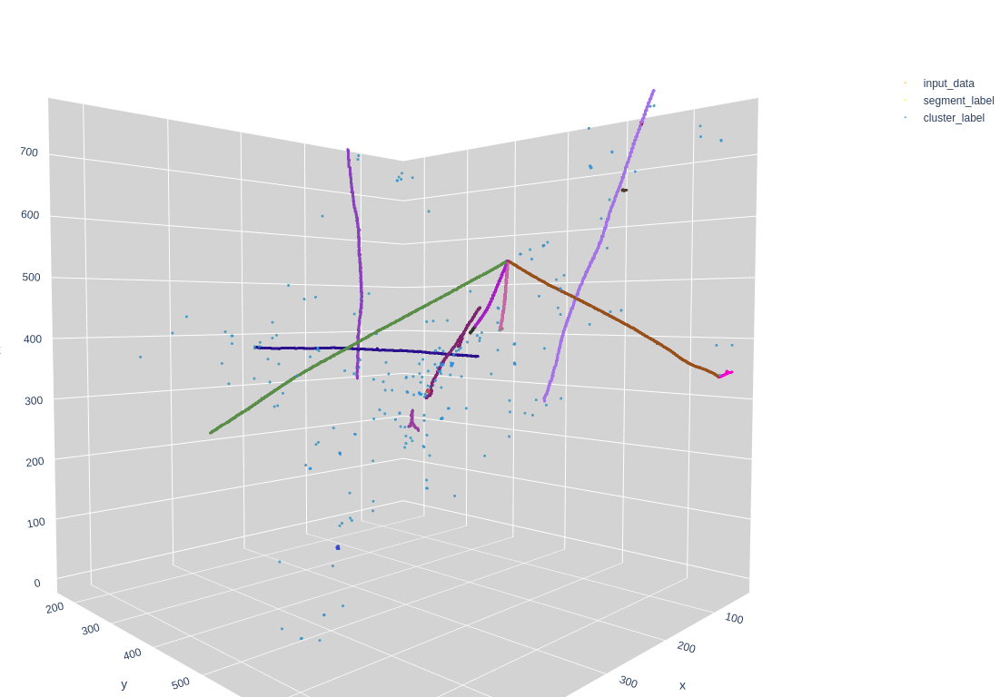

In [74]:
trace = []

edep = input_data[segment_label < 5]
trace+= scatter_points(edep,markersize=1,color=edep[:, -1], cmin=0,cmax=1)
trace[-1].name = 'input_data'

trace+= scatter_points(input_data[segment_label < 5],markersize=1,color=segment_label[segment_label < 5], cmin=0,cmax=4)
trace[-1].name = 'segment_label'

trace+= scatter_points(clust_label,markersize=1,color=clust_label[:, -5], colorscale=plotly.colors.qualitative.Dark24)
trace[-1].name = 'cluster_label'

fig = go.Figure(data=trace,layout=plotly_layout3d())
fig.update_layout(legend=dict(x=1.1, y=0.9))

iplot(fig)

## Outputs of the full chain

In [17]:
output.keys()

dict_keys(['accuracy', 'loss', 'accuracy_class_0', 'accuracy_class_1', 'accuracy_class_2', 'accuracy_class_3', 'accuracy_class_4', 'seg_accuracy', 'seg_loss', 'ppn_acc', 'ppn_loss', 'loss_class', 'loss_distance', 'loss_ppn1', 'loss_ppn2', 'acc_ppn1', 'acc_ppn2', 'fraction_positives_ppn1', 'fraction_positives_ppn2', 'fraction_negatives_ppn1', 'fraction_negatives_ppn2', 'acc_ppn_type', 'loss_type', 'num_labels', 'num_discarded_labels_ppn1', 'num_discarded_labels_ppn2', 'num_positives_ppn1', 'num_positives_ppn2', 'ppn_accuracy', 'mask_loss', 'seed_loss', 'smoothing_loss', 'inter_loss', 'mask_loss_0', 'seed_loss_0', 'mask_loss_1', 'seed_loss_1', 'mask_loss_2', 'seed_loss_2', 'mask_loss_3', 'seed_loss_3', 'accuracy_0', 'accuracy_1', 'accuracy_2', 'accuracy_3', 'cnn_clust_accuracy', 'cnn_clust_loss', 'frag_edge_loss', 'frag_node_loss', 'frag_edge_accuracy', 'frag_node_accuracy', 'inter_edge_loss', 'inter_edge_accuracy', 'segmentation', 'ppn_feature_enc', 'ppn_feature_dec', 'points', 'ppn1', 

There are a lot of information stored in the `output` as you can see. We will focus on the ones that are not loss nor accuracy, but the predictions of the network.

In [18]:
entry = 0

### UResNet output
We can visualize the predicted non-ghost mask, as well as the semantic predictions.

In [19]:
clust_label = data['cluster_label'][entry]
input_data = data['input_data'][entry]
segment_label = data['segment_label'][entry][:, -1]

segment_pred = output['segmentation'][entry].argmax(axis=1)

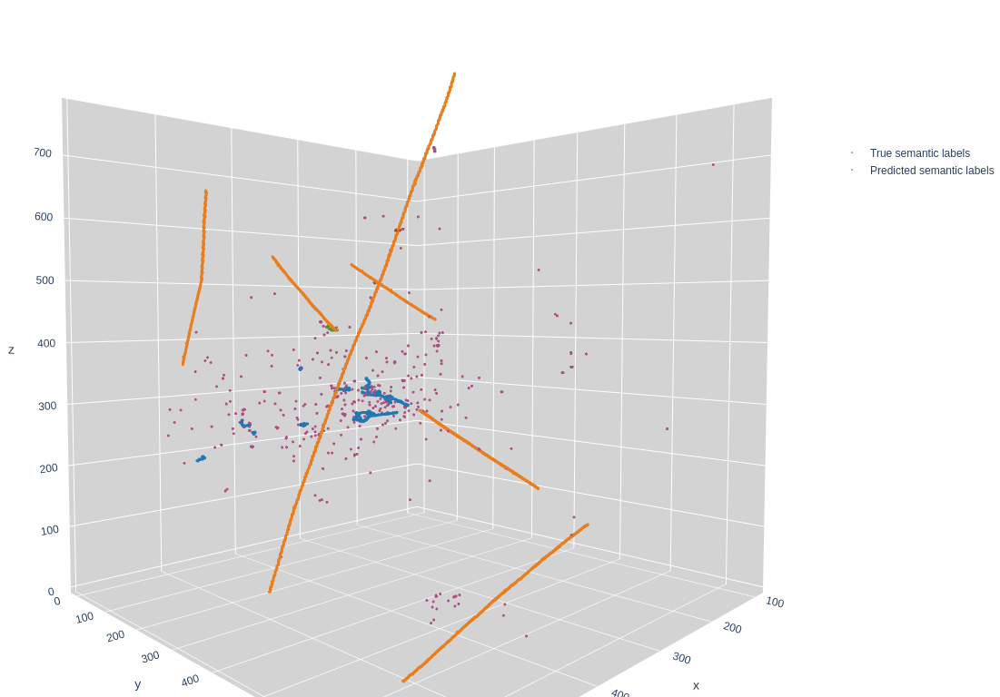

In [20]:
trace = []

trace+= scatter_points(input_data,markersize=1,color=segment_label, cmin=0, cmax=10, colorscale=plotly.colors.qualitative.D3)
trace[-1].name = 'True semantic labels'

trace+= scatter_points(input_data,markersize=1,color=segment_pred, cmin=0, cmax=10, colorscale=plotly.colors.qualitative.D3)
trace[-1].name = 'Predicted semantic labels'

fig = go.Figure(data=trace,layout=plotly_layout3d())
fig.update_layout(legend=dict(x=1.0, y=0.8))

iplot(fig)

### PPN output

In [21]:
ppn = uresnet_ppn_type_point_selector(data['input_data'][entry], output, entry=entry,
                                      score_threshold=0.5, type_threshold=2)
# #ppn = uresnet_ppn_type_point_selector(data['input_data'][entry], output, entry=entry, score_threshold=0.9, window_size=3, type_threshold=2)
# # ppn = uresnet_ppn_point_selector(data['input_data'][entry], output, entry=entry, score_threshold=0.6, window_size=10, nms_score_threshold=0.99)

ppn_voxels = ppn[:, :3]
ppn_score = ppn[:, 5]
ppn_type = ppn[:, -1]

print(ppn.shape)

(27, 13)


The columns of `ppn` contain in this order:
- point coordinates x, y, z
- batch id
- detection score (2 softmax values)
- occupancy (how many points were merge to this single point during post processing)
- softmax scores for 5 semantic types
- type prediction (max softmax score among 5 semantic types)

You can also use the softmax scores for the 5 semantic types to make finer point type predictions - for example at a vertex, you can expect these scores to be high for two or more types.

In [22]:
is_not_delta = ppn[:, -3] < 0.5
ppn_voxels = ppn_voxels[is_not_delta]
ppn_score = ppn_score[is_not_delta]
ppn_type = ppn_type[is_not_delta]

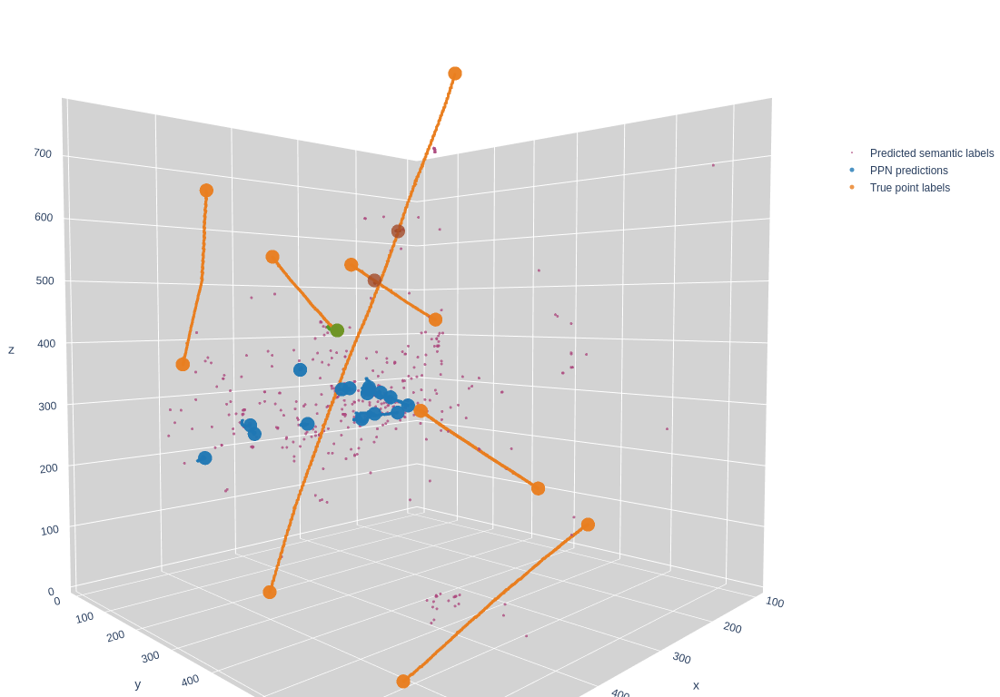

In [23]:
trace = []

trace+= scatter_points(input_data,markersize=1,color=segment_pred, cmin=0, cmax=10, colorscale=plotly.colors.qualitative.D3)
trace[-1].name = 'Predicted semantic labels'

trace += scatter_points(ppn_voxels, markersize=5, color=ppn_type, cmin=0, cmax=10, colorscale=plotly.colors.qualitative.D3, hovertext=ppn_score)
trace[-1].name = "PPN predictions"
# trace[-1].marker.colorscale= ['cyan', 'rgb(255,234,0)', 'rgb(127, 188, 65)', 'purple', 'rgb(255,111,0)']

trace += scatter_points(data['particles_label'][entry], markersize=5, color=data['particles_label'][entry][:, 4], cmin=0, cmax=10, colorscale=plotly.colors.qualitative.D3)
trace[-1].name = "True point labels"
# trace[-1].marker.colorscale= ['cyan', 'rgb(255,234,0)', 'rgb(127, 188, 65)', 'purple', 'rgb(255,111,0)']

fig = go.Figure(data=trace,layout=plotly_layout3d())
fig.update_layout(legend=dict(x=1.0, y=0.8))

iplot(fig)


### CNN clustering output
We can chose a set of threshold parameters optimized towards purity or ARI:

In [24]:
# optimizing for purity
p_thresholds = {
    0: 0.95, #0.14,
    1: 0.95, #0.24,
    2: 0.95, #0.48,
    3: 0.95 #0.48
}
s_thresholds = {
    0: 0.0, #0.8,
    1: 0.0, #0.90,
    2: 0.0, #0.55,
    3: 0.35 #0.80
}

In [25]:
# optimizing for ARI
p_thresholds = {
    0: 0.3068421052631579, #0.14,
    1: 0.05947368421052632, #0.24,
    2: 0.8015789473684211, #0.48,
    3: 0.8510526315789474 #0.48
}
s_thresholds = {
    0: 0.01, #0.8,
    1: 0.95, #0.90,
    2: 0.05, #0.55,
    3: 0.9 #0.80
}

In [26]:
batch_mask = []
count = 0
for e in range(len(data['input_data'])):
    batch_mask.append(np.ones((data['input_data'][e].shape[0],)) * e)
    count += data['input_data'][e].shape[0]
batch_mask = np.hstack(batch_mask)
#print(count, batch_mask.shape, np.unique(batch_mask), len(output['embeddings']))
embeddings = np.array(output['embeddings'])[batch_mask == entry]
margins = np.array(output['margins'])[batch_mask == entry]
seediness = np.array(output['seediness'])[batch_mask == entry]
print(embeddings.shape, margins.shape, seediness.shape)

(4662, 3) (4662, 1) (4662, 1)


We are going to focus on tracks (semantic class 1).

In [27]:
c = 1
class_mask = segment_pred == c
print(np.count_nonzero(class_mask), embeddings.shape, segment_pred.shape)

3317 (4662, 3) (4662,)


In [28]:
cluster_preds, cluster_prob = fit_predict(embeddings = embeddings[class_mask],
                                          seediness = seediness[class_mask], 
                                          margins = margins[class_mask], 
                                          fitfunc = gaussian_kernel,
                                          s_threshold=s_thresholds[c],
                                          p_threshold=p_thresholds[c])

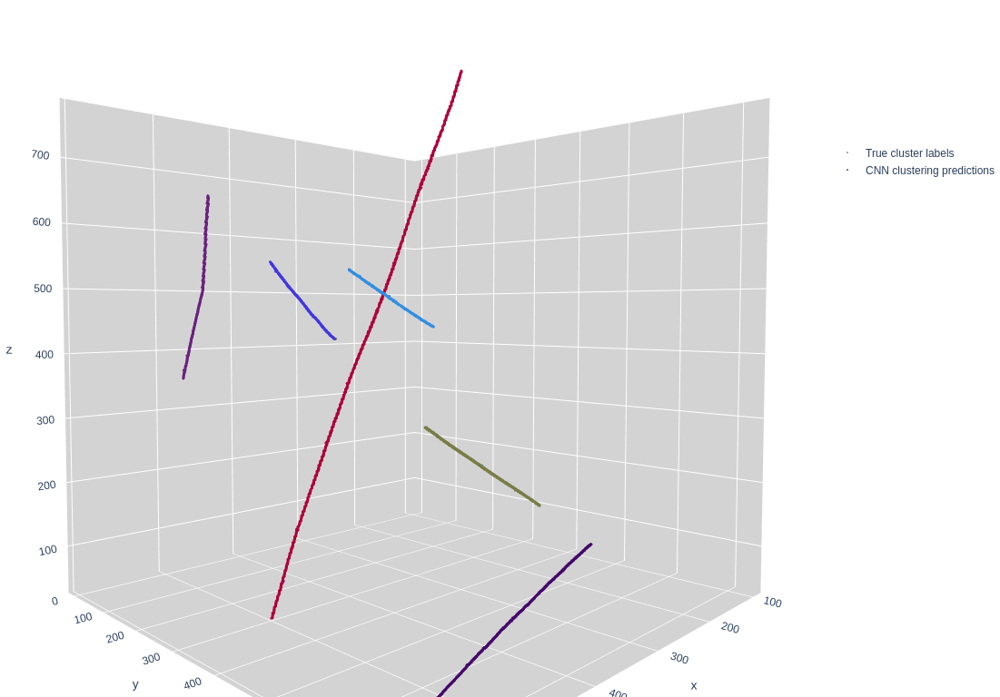

In [29]:
trace = []

edep = data['input_data'][entry]

trace+= scatter_points(clust_label[clust_label[:, -1] == c],
                       markersize=1,
                       color=clust_label[clust_label[:, -1] == c, -5],
                       hovertext=clust_label[clust_label[:, -1] == c, -5],
                       colorscale=plotly.colors.qualitative.Dark24)

trace[-1].name = 'True cluster labels'

trace+= scatter_points(edep[class_mask],
                       markersize=1,
                       color=cluster_preds,
                       hovertext=cluster_preds,
                       colorscale=plotly.colors.qualitative.Dark24)

trace[-1].name = 'CNN clustering predictions'

fig = go.Figure(data=trace,layout=plotly_layout3d())
fig.update_layout(legend=dict(x=1.0, y=0.8))

iplot(fig)


### GNN shower clustering output

In [30]:
clust_ids_true = get_cluster_label(torch.tensor(clust_label), output['fragments'][entry], column=6)
clust_ids_pred = output['frag_group_pred'][entry]

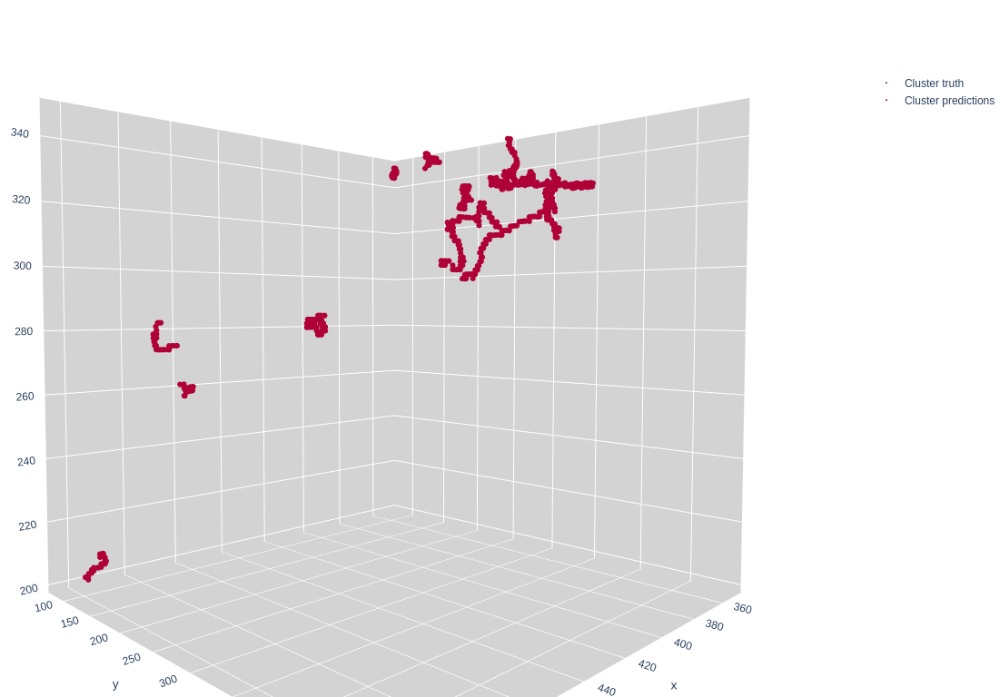

In [31]:
trace = []

trace += network_topology(data['input_data'][entry],
                         output['fragments'][entry],
                         #edge_index=output['frag_edge_index'][entry],
                         clust_labels=clust_ids_true,
                         markersize=2, cmin=0, cmax=10, colorscale=plotly.colors.qualitative.Dark24)
trace[-1].name = 'Cluster truth'

trace += network_topology(data['input_data'][entry],
                         output['fragments'][entry],
                         #edge_index=output['frag_edge_index'][entry],
                         clust_labels=clust_ids_pred,
                         markersize=2, cmin=0, cmax=10, colorscale=plotly.colors.qualitative.Dark24)
trace[-1].name = 'Cluster predictions'

fig = go.Figure(data=trace,layout=plotly_layout3d())
fig.update_layout(legend=dict(x=1.1, y=0.9))

iplot(fig)

### GNN interaction clustering output

In [32]:
clust_ids_true = get_cluster_label(torch.tensor(clust_label), output['particles'][entry], column=7)
clust_ids_pred = output['inter_group_pred'][entry]

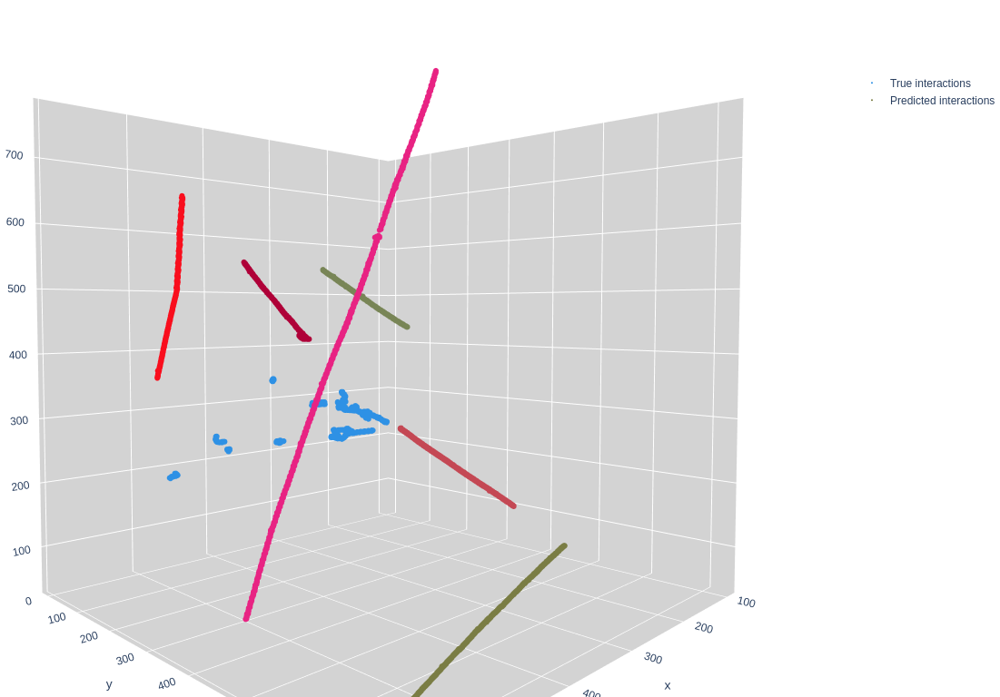

In [33]:
trace = []

trace += network_topology(data['input_data'][entry],
                         output['particles'][entry],
                         #edge_index=output['frag_edge_index'][entry],
                         clust_labels=clust_ids_true,
                         markersize=2, colorscale=plotly.colors.qualitative.Dark24)
trace[-1].name = 'True interactions'

trace += network_topology(data['input_data'][entry],
                         output['particles'][entry],
                         #edge_index=output['frag_edge_index'][entry],
                         clust_labels=clust_ids_pred,
                         markersize=2, colorscale=plotly.colors.qualitative.Dark24)
trace[-1].name = 'Predicted interactions'

fig = go.Figure(data=trace,layout=plotly_layout3d())
fig.update_layout(legend=dict(x=1.1, y=0.9))

iplot(fig)